In [1]:
import pickle
from pathlib import Path

import cv2
import joblib
import numpy as np
from PIL import Image
from pillow_heif import register_heif_opener

import matplotlib.pyplot as plt

In [2]:
heic_test_image_1 = Path("/tf/notebooks/gotmeals/data/sample_data/IMG_0119.PNG")
register_heif_opener()
xx = Image.open(heic_test_image_1)
image_1 = np.asarray(xx)


In [3]:
#image_1_masks_joblib = Path("./masks_img_0119_heic.lzma")
image_1_masks_joblib = Path("./masks_img_0119_heic_2.lzma")
masks = joblib.load(image_1_masks_joblib)

In [4]:
def show_anns(anns):
    if len(anns) == 0:
        return
    sorted_anns = sorted(anns, key=(lambda x: x["area"]), reverse=True)
    ax = plt.gca()
    ax.set_autoscale_on(False)

    img = np.ones(
        (
            sorted_anns[0]["segmentation"].shape[0],
            sorted_anns[0]["segmentation"].shape[1],
            4,
        )
    )
    img[:, :, 3] = 0
    for ann in sorted_anns:
        m = ann["segmentation"]
        color_mask = np.concatenate([np.random.random(3), [0.35]])
        img[m] = color_mask
    ax.imshow(img)

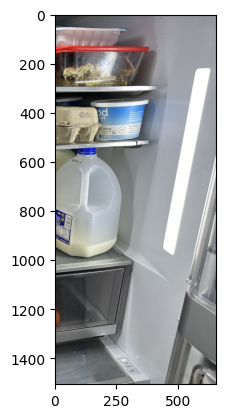

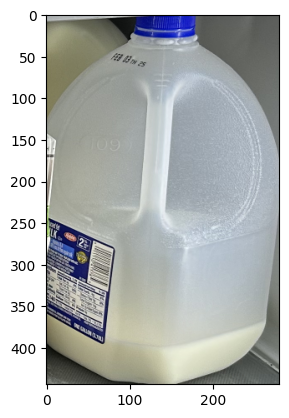

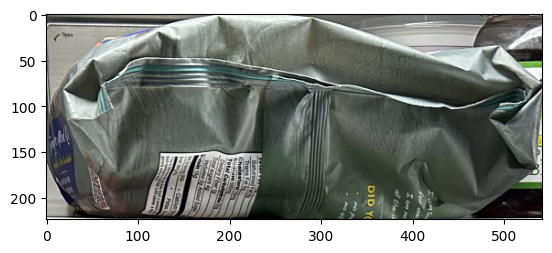

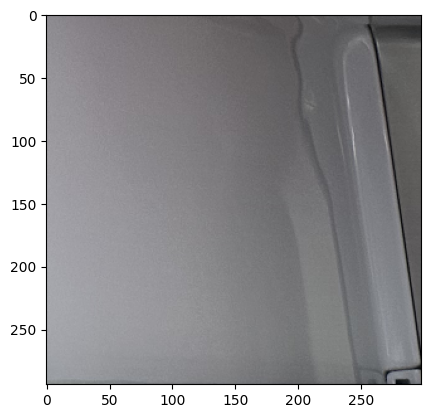

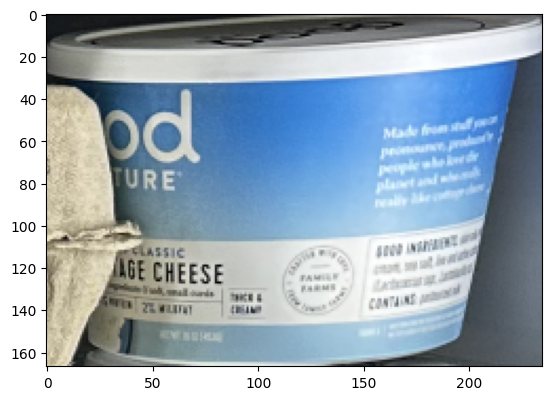

...

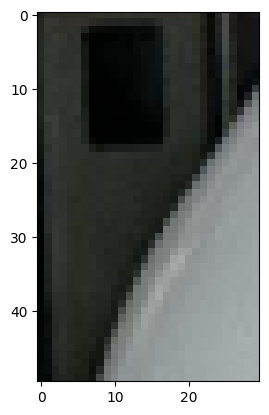

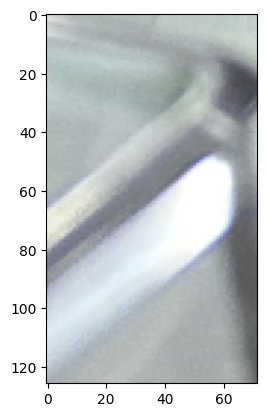

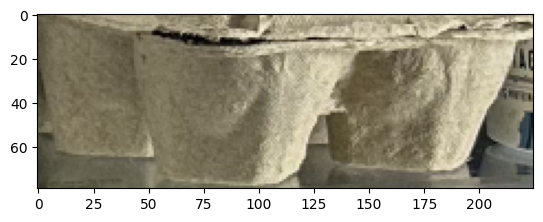

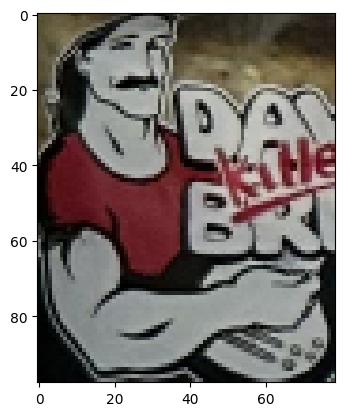

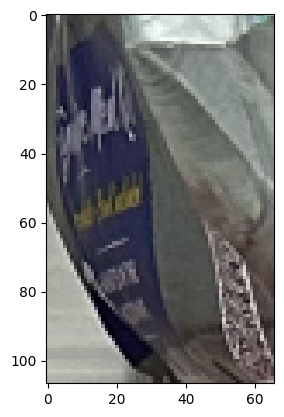

In [5]:
image_bounding_boxes = []
for mask in masks:
    x0 = mask["bbox"][0]
    y0 = mask["bbox"][1]
    x1 = x0 + mask["bbox"][2]
    y1 = y0 + mask["bbox"][3]
    cropped_image = image_1[y0:y1, x0:x1, :]
    image_bounding_boxes.append(cropped_image)

for image in image_bounding_boxes:
    plt.imshow(image)
    plt.show()
    plt.close()